In [1]:
## Module Management
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

## Question 1.

Use the np.log() function to log the values of RGDP per capita. Create a lag for this new variable and rerun the regression using these new logged values as well as untransformed Economic Freedom Index Values (don't log these variables!). (hint: you may reimport the csv file).

# check for removal of infiniy values before dropping nan().

In [2]:
data = pd.read_csv("../In Class Work/fraserDataWithRGDPPC.csv", index_col = [0,1], parse_dates = True)

# Transform the data frame to ensure a "cross-joined" set of all countries, all years.
# We will drop na() later...
years = np.array(sorted(list(set(data.index.get_level_values("Year")))))
years = pd.date_range(years[0], years[-2], freq = "AS")
countries = sorted(list(set(data.index.get_level_values("ISO_Code"))))
index_names = list(data.index.names)
multi_index = pd.MultiIndex.from_product([countries, years[:-1]], names = data.index.names)

# Reindex the dataframe so we have country codes and Jan 1 of every year.
data = data.reindex(multi_index)

# log() the RGDP per Capita into new column ("key"):
data["log RGDP per Capita"] = np.log(data[["RGDP Per Capita"]])

# lAG the data using shift to get teh previous year's log() number
data["Lagged RGDP per Capita"] = data.groupby(["ISO_Code"])["log RGDP per Capita"].shift()

# see the new keys in the dataframe
data

EFW  Size of Government  \
ISO_Code Year                                       
AGO      1970-01-01       NaN                 NaN   
         1971-01-01       NaN                 NaN   
         1972-01-01       NaN                 NaN   
         1973-01-01       NaN                 NaN   
         1974-01-01       NaN                 NaN   
...                       ...                 ...   
ZWE      2011-01-01  4.843441            6.424630   
         2012-01-01  4.971192            6.670469   
         2013-01-01  5.246723            6.325105   
         2014-01-01  5.582478            6.433165   
         2015-01-01  6.145330            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      1970-01-01                             NaN          NaN   
         1971-01-01                             NaN          NaN   
         1972-01-01                             NaN          NaN   
         1973-01-01                             NaN          NaN   
         1974-01-01                             NaN          NaN   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      1970-01-01                               NaN         NaN   
         1971-01-01                               NaN         NaN   
         1972-01-01                               NaN         NaN   
         1973-01-01                               NaN         NaN   
         1974-01-01                               NaN         NaN   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     RGDP Per Capita  log RGDP per Capita  \
ISO_Code Year                                               
AGO      1970-01-01              NaN                  NaN   
         1971-01-01              NaN                  NaN   
         1972-01-01              NaN                  NaN   
         1973-01-01              NaN                  NaN   
         1974-01-01              NaN                  NaN   
...                              ...                  ...   
ZWE      2011-01-01           1515.0             7.323171   
         2012-01-01           1604.0             7.380256   
         2013-01-01           1604.0             7.380256   
         2014-01-01           1594.0             7.374002   
         2015-01-01           1560.0             7.352441   

                     Lagged RGDP per Capita  
ISO_Code Year                                
AGO      1970-01-01                     NaN  
         1971-01-01                     NaN  
         1972-01-01                     NaN  
         1973-01-01                     NaN  
         1974-01-01                     NaN  
...                                     ...  
ZWE      2011-01-01                7.247081  
         2012-01-01                7.323171  
         2013-01-01                7.380256  
         2014-01-01                7.380256  
         2015-01-01                7.374002  

[7452 rows x 9 columns]

## Question 2:
Plot the residuals in a bar chart. Explain why the shape of the distribution of these residuals are distinct from the shape of the residuals plotted in the first regression from this lesson.



In [3]:
y_var = ["Lagged RGDP per Capita"]

X_vars = ['Size of Government', 'Legal System & Property Rights',
          'Sound Money', 'Freedom to trade internationally', 'Regulation']

# create a list of key names which reflect the dependent variable and the independent variables...
regression_vars = y_var + X_vars

# Create new dataframe with the dependent variable & independent variables for the regression; drop na() values, too.
regression_data = data[regression_vars].dropna(how = "any", axis=0)

# check correlations;
regression_data.corr()

,Lagged RGDP per Capita,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation
Lagged RGDP per Capita,1.000000,-0.204866,0.745208,0.549988,0.638463,0.535735
Size of Government,-0.204866,1.000000,-0.169715,0.111486,0.139360,0.079089
Legal System & Property Rights,0.745208,-0.169715,1.000000,0.585910,0.678791,0.656242
Sound Money,0.549988,0.111486,0.585910,1.000000,0.749706,0.567352
Freedom to trade internationally,0.638463,0.139360,0.678791,0.749706,1.000000,0.652344
Regulation,0.535735,0.079089,0.656242,0.567352,0.652344,1.000000


In [4]:
# y is dependent variables, or endogenous variables
y = regression_data[y_var]

# X is the independent variables, or exogenous variables
X = regression_data[X_vars]

# fit the model
model_results = sm.OLS(y, X).fit()

# View summary of model fit.
model_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                   OLS Regression Results                                  
===========================================================================================
Dep. Variable:     Lagged RGDP per Capita   R-squared (uncentered):                   0.988
Model:                                OLS   Adj. R-squared (uncentered):              0.988
Method:                     Least Squares   F-statistic:                          3.234e+04
Date:                    Tue, 26 Oct 2021   Prob (F-statistic):                        0.00
Time:                            21:43:05   Log-Likelihood:                         -2875.4
No. Observations:                    1999   AIC:                                      5761.
Df Residuals:                        1994   BIC:                                      5789.
Df Model:                               5                                                  
Covariance Type:                nonrobust                                                  
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Size of Government                   0.1342      0.020      6.817      0.000       0.096       0.173
Legal System & Property Rights       0.2718      0.022     12.613      0.000       0.230       0.314
Sound Money                          0.1187      0.023      5.138      0.000       0.073       0.164
Freedom to trade internationally     0.4290      0.034     12.539      0.000       0.362       0.496
Regulation                           0.4023      0.029     13.827      0.000       0.345       0.459
==============================================================================
Omnibus:                      417.783   Durbin-Watson:                   0.220
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1219.529
Skew:                           1.069   Prob(JB):                    1.52e-265
Kurtosis:                       6.173   Cond. No.                         26.2
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [5]:
# create list of predictions from model
predictor = model_results.predict()

# ... append "Predictor" label to the name of the independent variable, so we know this new
# column is the prediction variable...
regression_data[y_var[0] + " Predictor"] = predictor

# Now, see the last column; see that it has the "Lagged RGDP... Predictor" key name (column label)
regression_data

Lagged RGDP per Capita  Size of Government  \
ISO_Code Year                                                     
AGO      2006-01-01                8.544030            5.342913   
         2007-01-01                8.703507            5.239228   
         2008-01-01                8.878079            5.307379   
         2009-01-01                8.979165            7.104953   
         2010-01-01                8.974618            5.738678   
...                                     ...                 ...   
ZWE      2011-01-01                7.247081            6.424630   
         2012-01-01                7.323171            6.670469   
         2013-01-01                7.380256            6.325105   
         2014-01-01                7.380256            6.433165   
         2015-01-01                7.374002            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      2006-01-01                        3.546463     4.061198   
         2007-01-01                        3.569182     4.453327   
         2008-01-01                        3.654098     5.032836   
         2009-01-01                        3.622792     5.238259   
         2010-01-01                        3.672884     5.570226   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      2006-01-01                          6.158949    5.306135   
         2007-01-01                          6.115462    5.524626   
         2008-01-01                          5.687976    5.221726   
         2009-01-01                          5.811844    5.011598   
         2010-01-01                          6.189831    5.692320   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     Lagged RGDP per Capita Predictor  
ISO_Code Year                                          
AGO      2006-01-01                          6.939457  
         2007-01-01                          7.047511  
         2008-01-01                          6.843275  
         2009-01-01                          7.068895  
         2010-01-01                          7.374625  
...                                               ...  
ZWE      2011-01-01                          6.482974  
         2012-01-01                          6.298649  
         2013-01-01                          6.584522  
         2014-01-01                          6.930429  
         2015-01-01                          7.977471  

[1999 rows x 7 columns]

In [6]:
#y_hat is the predicted value...
y_hat = regression_data[y_var[0] + " Predictor"]

#y_mean is the average of the dependent/endogenous variable...
y_mean = regression_data[y_var[0]].mean()

# y is the dependent/endogenous variable...
y = regression_data[y_var[0]]

# "Residuals" are the distance between the predicted value and the average of teh real values.
regression_data["Residuals"] = (y_hat.sub(y_mean))

# Squared residuals are... residuals raised to the power of 2!
regression_data["Squared Residuals"] = regression_data["Residuals"].pow(2)

# The error is the distnace between the actual and the predicted values; raised to 2nd power... voila: SQUARED ERROR!
regression_data["Squared Errors"] = (y.sub(y_hat)) ** 2

# Squared totals is the distnace between actual and the average of all actuals, then squared... eh?
regression_data["Squared Totals"] = (y.sub(y_mean)) ** 2

# See the new dataframe for "Regression Data"
regression_data

Lagged RGDP per Capita  Size of Government  \
ISO_Code Year                                                     
AGO      2006-01-01                8.544030            5.342913   
         2007-01-01                8.703507            5.239228   
         2008-01-01                8.878079            5.307379   
         2009-01-01                8.979165            7.104953   
         2010-01-01                8.974618            5.738678   
...                                     ...                 ...   
ZWE      2011-01-01                7.247081            6.424630   
         2012-01-01                7.323171            6.670469   
         2013-01-01                7.380256            6.325105   
         2014-01-01                7.380256            6.433165   
         2015-01-01                7.374002            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      2006-01-01                        3.546463     4.061198   
         2007-01-01                        3.569182     4.453327   
         2008-01-01                        3.654098     5.032836   
         2009-01-01                        3.622792     5.238259   
         2010-01-01                        3.672884     5.570226   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      2006-01-01                          6.158949    5.306135   
         2007-01-01                          6.115462    5.524626   
         2008-01-01                          5.687976    5.221726   
         2009-01-01                          5.811844    5.011598   
         2010-01-01                          6.189831    5.692320   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     Lagged RGDP per Capita Predictor  Residuals  \
ISO_Code Year                                                      
AGO      2006-01-01                          6.939457  -2.215712   
         2007-01-01                          7.047511  -2.107659   
         2008-01-01                          6.843275  -2.311894   
         2009-01-01                          7.068895  -2.086275   
         2010-01-01                          7.374625  -1.780544   
...                                               ...        ...   
ZWE      2011-01-01                          6.482974  -2.672195   
         2012-01-01                          6.298649  -2.856521   
         2013-01-01                          6.584522  -2.570648   
         2014-01-01                          6.930429  -2.224740   
         2015-01-01                          7.977471  -1.177698   

                     Squared Residuals  Squared Errors  Squared Totals  
ISO_Code Year                                                           
AGO      2006-01-01           4.909382        2.574654        0.373492  
         2007-01-01           4.442225        2.742323        0.203999  
         2008-01-01           5.344855        4.140427        0.076779  
         2009-01-01           4.352543        3.649132        0.030978  
         2010-01-01           3.170338     

(array([-6., -4., -2.,  0.,  2.,  4.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

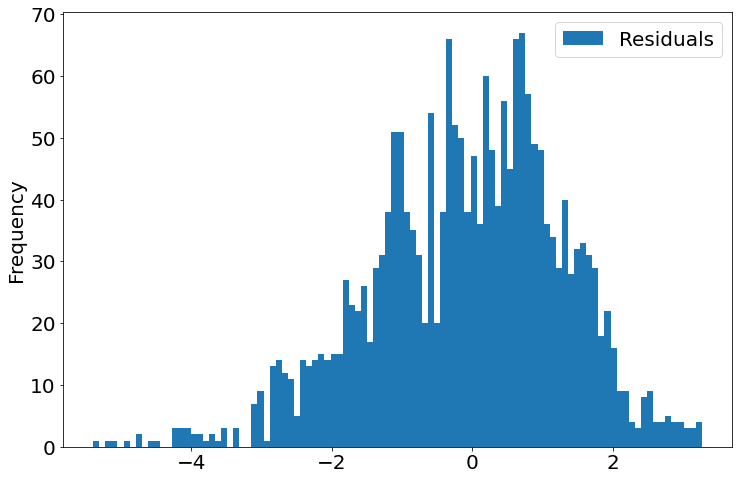

In [7]:
# Here we're going to go w/ the real "residuals", or the distance betwene the predicted values and the
# average (mean) of all real dependent/exogenous values.

plt.rcParams.update({"font.size":20})

fig, ax = plt.subplots(figsize = (12,8))
regression_data[["Residuals"]].plot.hist(bins = 100, 
                                         ax = ax)
#In this example, we'll just set x-axis roation to 0 as the data isn't too big to require rotation
plt.xticks(rotation=0)

## Explaining Difference in shape of residual histograms

My understanding is that the first histogram of the residuals was plotting residuals of unlogged data, meaning you're looking at the distances (expressed in dollars of RGDP) between the observed and predicted values. The histogram above is a look at time series data with the RGDP per capita being logged and illustrating the rate of change between years. The above histogram suggests long tails (skewed left) indicating decreasing rates of change in RGDP as well as larger negative rates of change vs. smaller, growth rates of change.

## Question 3(a)
Plot a scatter plot with RGDP Per Capita on the horizontal axis and the predictor on the vertical axis. 


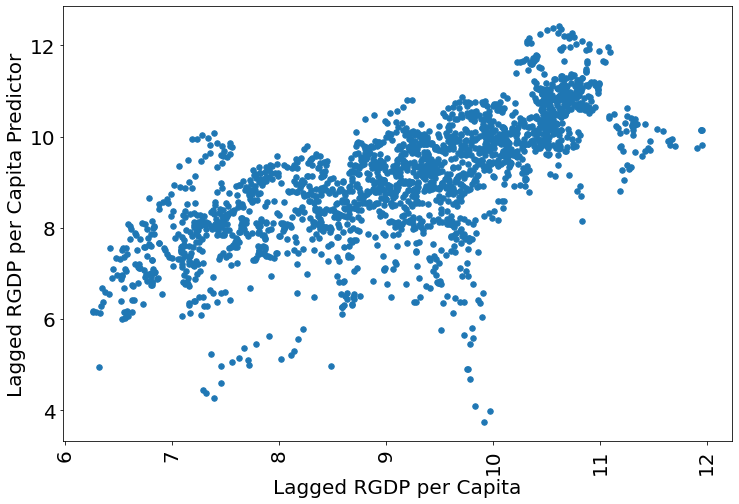

In [8]:
fig, ax = plt.subplots(figsize = (12,8))
regression_data.plot.scatter(x = "Lagged RGDP per Capita",
                             y = "Lagged RGDP per Capita Predictor",
                             s = 30, 
                             ax = ax)
plt.xticks(rotation=90)
plt.show()
plt.close()

## Question 3(b)
Then plot a scatter plot with RGDP Per Capita on the horizontal axis and the residual on the vertical axis.

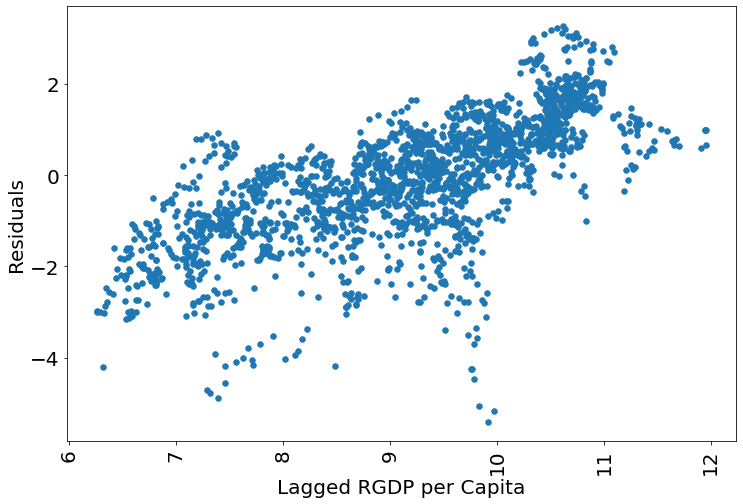

In [9]:
fig, ax = plt.subplots(figsize = (12,8))
regression_data.plot.scatter(x = "Lagged RGDP per Capita",
                             y = "Residuals",
                             s = 30, 
                             ax = ax)
plt.xticks(rotation=90)
plt.show()
plt.close()

## Question 3(c)
Are the residuals normally distributed? Why or why not? Why does this matter?

The data is not normally distributed. It is not normal because we're dealing with time series data and likely should have evaluated the rate of change between time periods. In doing so, that would likley have tightened the distribution of values and the histogram of the rates of change would likely appear something closer to approximating normal.

As a matter of preference, you want to work with normalized data in regression analyses; using non-normalized data will provide misleading results and may lead to drawing incorrect, or flawed conclusions from the data.

## Question 4

Plot the observed and predicted logged values of RGDP Per Capita for each individual country.

C:\Users\SAND8464\AppData\Local\Temp/ipykernel_24500/4010954319.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data[key] = plot_data[key] + 1
C:\Users\SAND8464\AppData\Local\Temp/ipykernel_24500/4010954319.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (12,8))


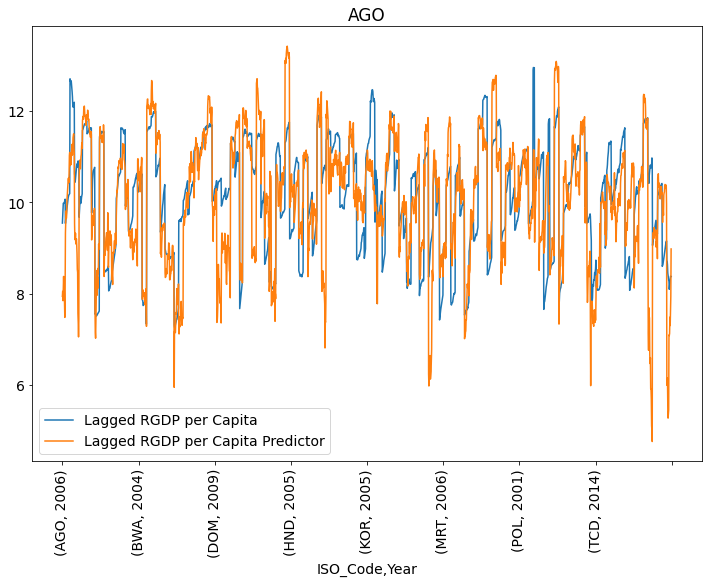

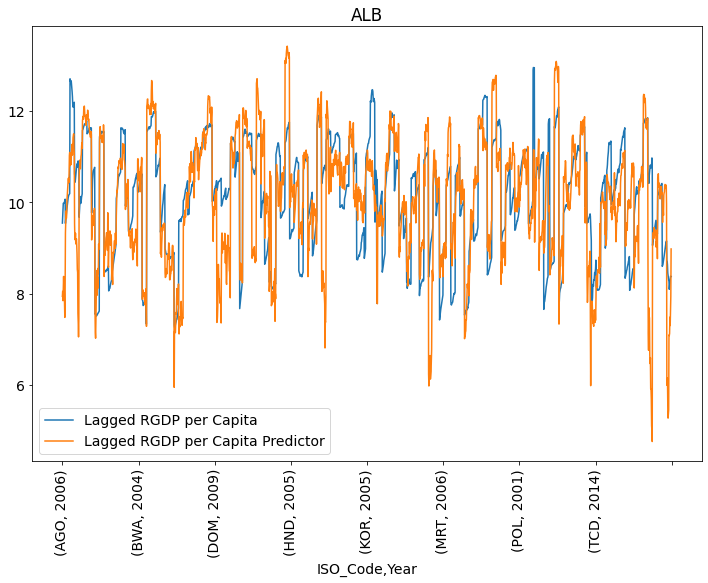

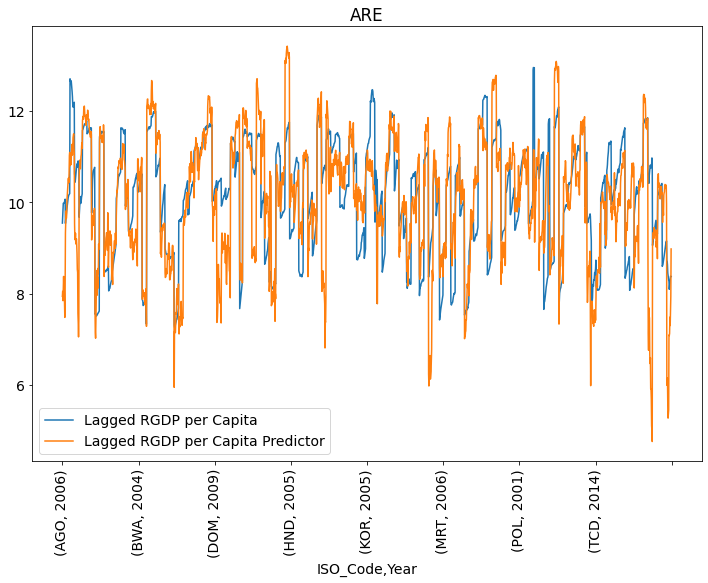

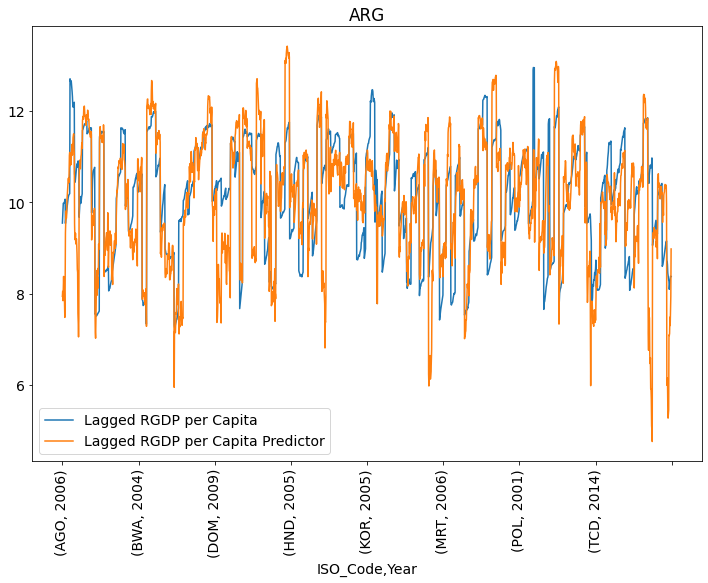

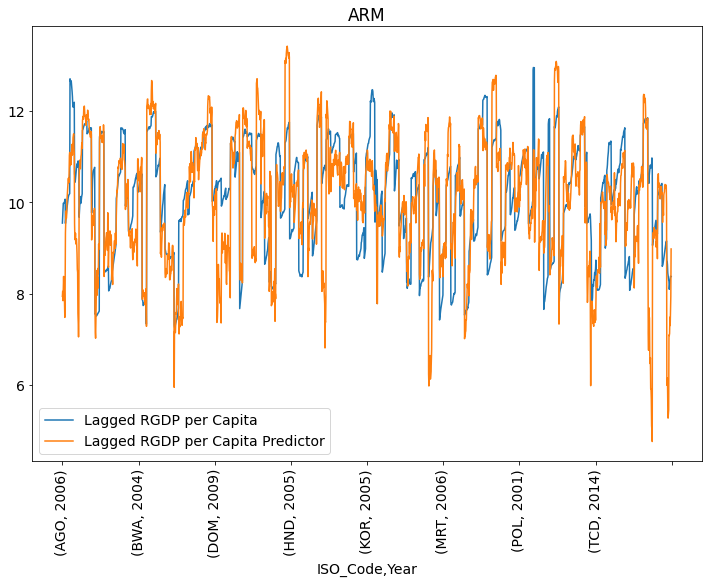

...

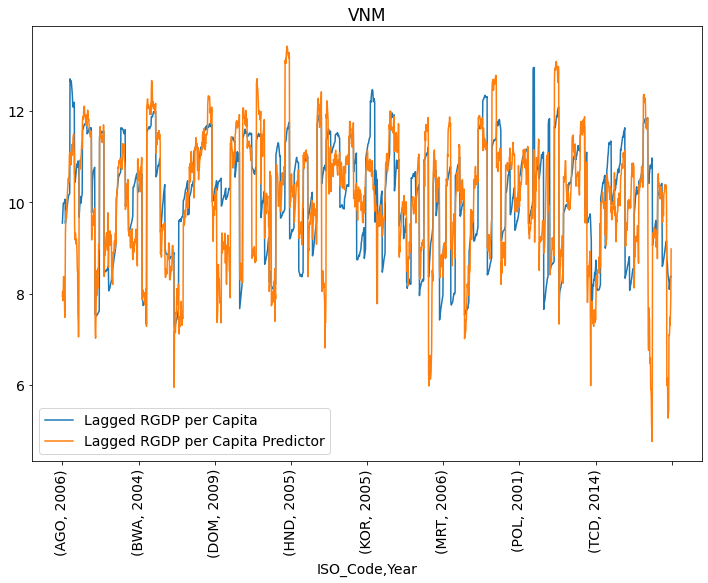

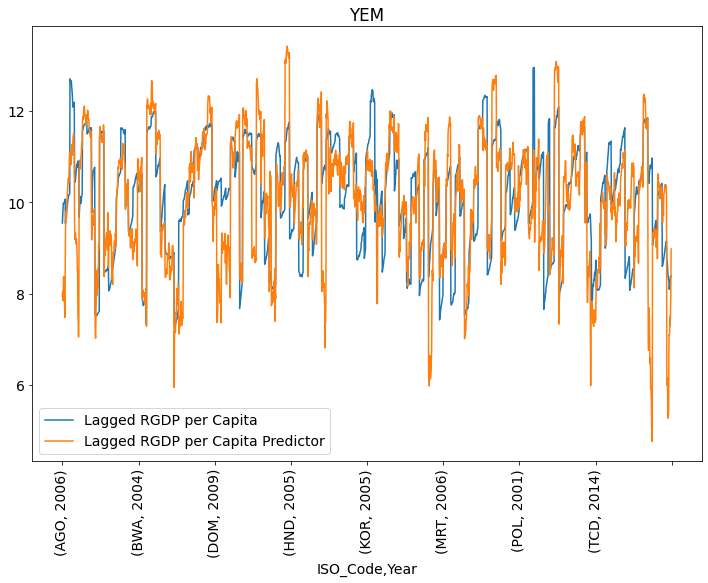

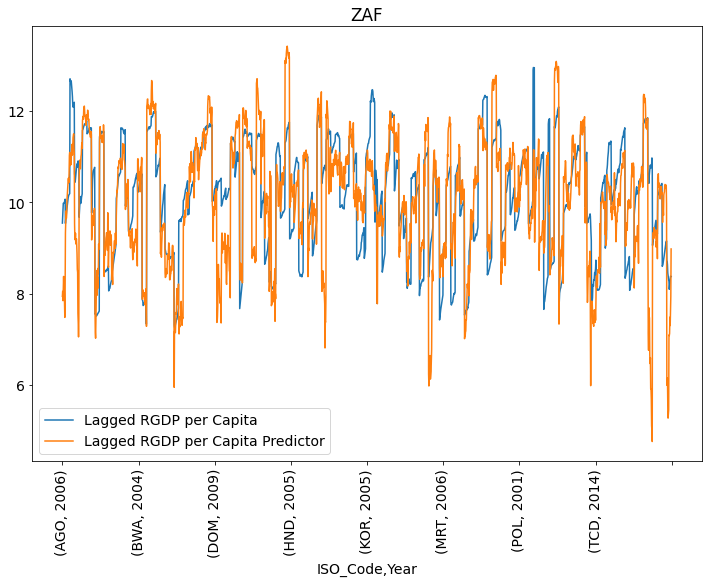

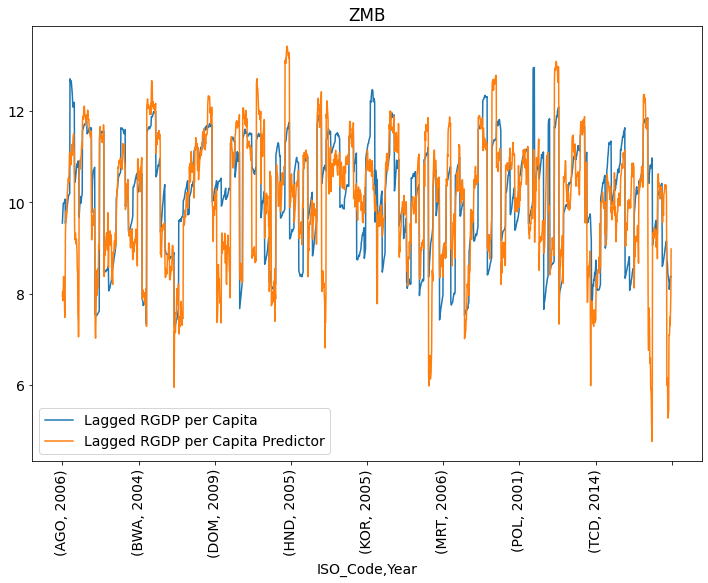

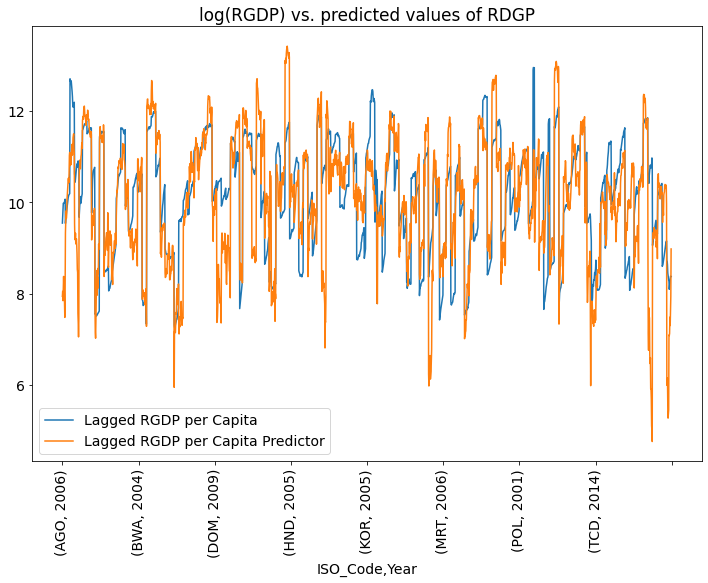

In [10]:
import datetime as dt
countries = regression_data.groupby("ISO_Code").mean().index
plot_data = regression_data[y_var + ["Lagged RGDP per Capita Predictor"]]

plot_data.index = plot_data.index.set_levels([plot_data.index.levels[0], 
                                              plot_data.index.levels[1].strftime('%Y')])

plt.rcParams.update({'font.size': 14})
for key in plot_data:
    plot_data[key] = plot_data[key] + 1 

for country in countries:
    fig, ax = plt.subplots(figsize = (12,8))
    plot_data.plot.line(ax = ax, legend = True)
    ax.set_title(country)
    plt.xticks(rotation=90)
    plt.plot()
    
plt.title("log(RGDP) vs. predicted values of RDGP")
plt.show()
plt.close()